## El español presenta una red libre de escala?

Se determina que tipo de red representa la semántica de un conjunto de 10,000 textos escritos obtenidos de Wikipedia en español. Se procesan los textos usando la obtención de raíces (steamming) y un filtro por stopwords para eliminar los adverbios, pronombres o las preposiciones de los textos y obtener el nucleo semántico de los textos.

    Daniel Bustillos

---

Una red libre de escala es un tipo de red en la cuál las conexiones de sus nodos siguen la ley de potencias $(P(k) \ \sim \ k^\boldsymbol{-\gamma}$), por lo cuál existen algunos pocos nodos llamados hubs que están altamente conectados y muchos otros que sus conexiones a otros nodos es bajo.  

![comparacion](resources/Scale-free_network_sample.png)



### Ejemplos 

Además del ejemplo de las redes de páginas Web, existen muchas otras redes libres de escala:

- La red de amistades entre personas. Esto también se puede extender a las redes de llamadas telefónicas, de envíos postales y de correo electrónico, por ejemplo.
- Las redes del crimen organizado, en los cuales unos cuantos "peces gordos" ordenan la actuación de muchos "peces chicos".
- Las redes de neuronas en los organismos dotados de sistema nervioso, lo que significa que permanentemente usamos mucho una fracción de las neuronas, mientras que la mayoría de las neuronas las ocupamos muy poco.

Pausemos brevemente esta introducción acelerada y sigamos a Sylvie Moritz-Gasser y Hugues Duffau, en la introducción de su artículo "Evidence of a large-scale network underlying language switching: A brain stimulation study. Case report"


        Este hombre bilingüe (francés e inglés) diestro de 47 años se sometió a una cirugía despierta por un glioma en el lóbulo temporal posterior dominante izquierdo. Durante el nombramiento intraoperatorio de imágenes, la electroestimulación directa de un área cortical discreta dentro de la parte posterior del surco temporal superior provocó un cambio involuntario de idioma (francés a inglés). Además, durante la resección del tumor, el mapeo eléctrico subcortical nuevamente generó un cambio de idioma reproducible (francés a inglés) al estimular el fascículo longitudinal superior. Después del empeoramiento transitorio postoperatorio inmediato, el paciente recuperó el rendimiento normal del lenguaje. Sin embargo, tanto 7 días como 2 meses después, se observó otro episodio de cambio de idioma (francés a inglés) durante una tarea de denominación. Por lo tanto, tanto el mapeo intraoperatorio como las alteraciones posquirúrgicas transitorias apoyan la participación del área temporal posterior dominante izquierda y el fascículo longitudinal superior en el cambio de lenguaje. Curiosamente, se sabe que esta vía conecta la circunvolución temporal posterosuperior con el centro de Broca, una región que los autores han descrito como inductora de una posible activación de la estimulación. Por lo tanto, los autores sugieren la existencia de una red de distribución distribuida a gran escala para el cambio de idioma.

Su artículo ofrece una introducción directa al tema aludido en la introducción con un enfoque medico operatorio. A raíz de lo sugerido, me resultó interesante __explorar si el lenguaje (propiamente la semántica de este) representa una red de larga escala__. Sabemos de antemano que vamos a tener palabras que funcionen como hubs, los adverbios, pronombres o las preposiciones, estos resultan ser conectores entre un vervo, un sustantivo u otras oraciones pero no nos proporcionan información semántica del texto por lo cuál los eliminaremos.    

Los textos usados se obtienen de wikipedia usando **textacy**:

In [1]:
! pip install textacy
! pip install nltk
! pip install joblib
! mkdir textos

    100% |████████████████████████████████| 235kB 1.4MB/s ta 0:00:011
    100% |████████████████████████████████| 481kB 721kB/s ta 0:00:011
    100% |████████████████████████████████| 143kB 6.3MB/s eta 0:00:01
    100% |████████████████████████████████| 296kB 831kB/s ta 0:00:011
    100% |████████████████████████████████| 1.5MB 779kB/s eta 0:00:01
    Complete output from command python setup.py egg_info:
    NetworkX 2.3+ requires Python 3.5 or later (2.7 detected).
    
    For Python 2.7, please install version 2.2 using:
    
    $ pip install 'networkx==2.2'
    
    
    ----------------------------------------
Command "python setup.py egg_info" failed with error code 1 in /tmp/pip-build-oVFIAN/networkx/
You are using pip version 8.1.1, however version 19.3.1 is available.
You should consider upgrading via the 'pip install --upgrade pip' command.
    100% |████████████████████████████████| 1.5MB 631kB/s ta 0:00:011
  Running setup.py bdist_wheel for nltk ... done
  Stored in dire

In [14]:
# Importando las librerías que vamos a utilizar
import pandas as pd
import numpy as np 
import matplotlib.pyplot as plt 
#import textacy
#from textacy.datasets import Wikipedia
import networkx as nx
from joblib import load,dump

import nltk
from nltk.stem import WordNetLemmatizer, SnowballStemmer
from nltk.tokenize import sent_tokenize, word_tokenize

from nltk.stem.porter import *
from scipy import stats
import seaborn as sns

from sklearn.metrics import mean_squared_error
from math import sqrt
from sklearn.metrics import r2_score

import matplotlib.pyplot as plt
from scipy.optimize import curve_fit

import string

nltk.download('wordnet')
nltk.download('punkt')

stemmer = SnowballStemmer('spanish')

from nltk import bigrams
nltk.download('stopwords')

# graficos incrustados
%matplotlib inline

ModuleNotFoundError: No module named 'joblib'

In [3]:
wp = Wikipedia(data_dir='./textos', lang='es',version='20190909')
Wikipedia.filepath = './textos/eswiki/20190909/eswiki-20190909-cirrussearch-content.json.gz'

In [4]:
textos = []
for text in wp.texts(limit=10):
     textos.append(text)
textos = ' '.join(textos)

Debido a que el tamaño de la descarga de la base de Wikipedia es de 6gb, para mantener el código reproducible, se guardan 10,000 artículos en un .pickle:

In [5]:
dump(textos, './textos/sample_wikipedia.pkl')

['./textos/sample_wikipedia.pkl']

In [6]:
textos = load('./textos/sample_wikipedia.pkl')

Convertimos a minusculas y quitamos signos de puntuación:

In [7]:
textos = textos.lower()
for char in string.punctuation:
    textos = textos.replace(char, ' ')

Se muestra una parte del texto:
    

In [8]:
textos[200:400]

'en el 2006 para el cruz azul en donde tuvo escasa participación  tan solo 40 minutos en el torneo clasificatorio mexicano para la copa libertadores 2007  razón por la cual fue cedido a la filial del a'

Primero, observemos una parte de la red sin hacer el procesamiento, para ello, definimos dos listas donde almacenaremos la palabra de inicio y la palabra final de cada par de palabras en el texto:

In [9]:
textos = textos.split()

In [10]:
lista_nodo_i = []
lista_nodo_j = []

for row in range(len(textos)-1):
    lista_nodo_i.append(textos[row])
    lista_nodo_j.append(textos[row+1])

Definimos una dataframe donde almacenaremos cada par de palabras:

In [11]:
df_bigram = pd.DataFrame(columns=["nodo_i",'nodo_j'],
            index=[i for i in range(len(lista_nodo_i))])

df_bigram.loc[:,'nodo_i'] = lista_nodo_i
df_bigram.loc[:,'nodo_j'] = lista_nodo_j

In [12]:
df_bigram.head()

,nodo_i,nodo_j
0,pablo,gabriel
1,gabriel,torres
2,torres,n
3,n,avellaneda
4,avellaneda,argentina


In [13]:
df_bigram.shape

(9517, 2)

In [14]:
G = nx.from_pandas_edgelist(df=df_bigram.sample(round(df_bigram.shape[0]*.03)), source='nodo_i',
                            target='nodo_j')

In [ ]:
fig, ax = plt.subplots(figsize=(40, 32))
ax.set_facecolor('xkcd:black')
pos = nx.spring_layout(G, k=1)

# Plot networks
nx.draw_networkx(G, pos,
                 font_size=6,
                 width=1,
                 edge_color='grey',
                 node_size=100,
                 node_color='xkcd:fuchsia',
                 with_labels = False,
                 ax=ax)

# crear etiquetas
for key, value in pos.items():
    x, y = value[0]+.035, value[1]+.045
    ax.text(x, y,
            s=key,
            bbox=dict(facecolor='black', alpha=0.75),
            horizontalalignment='center', fontsize=26,color='white')
plt.savefig("./graph_sin_procesar.png", dpi=1000)
plt.show()

/Users/danielbustillos/opt/anaconda3/lib/python3.7/site-packages/networkx/drawing/nx_pylab.py:579: MatplotlibDeprecationWarning: 
The iterable function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use np.iterable instead.
  if not cb.iterable(width):


Observamos que las palabras más comúnes son adverbios y pronombres, sin embargo estas palabras no son de nuestro interes ya que no contienen información semántica del texto, en el procesamiento de lenguaje natural, este es un problema común y *natural* del propio lenguaje, nos interesa explorar las relaciones de palabras de un texto y no quien hizo una acción o la cantidad de un objeto en que se realizo esta acción. Para el preprocesamiento de los textos se van a realizar los siguientes procesos:

- **Eliminación de stopwords** que es el nombre que reciben las palabras sin significado como artículos, pronombres, preposiciones, etc. al texto.[1]

- **Steamming-lemmatization de las palabras:** 
    Por razones gramaticales, los documentos utilizarán diferentes formas de una palabra, como organizar, organizado y organizar. Además, hay familias de palabras derivadas relacionadas con significados similares, como democracia y democratización. En muchas situaciones, parece que sería útil para una búsqueda de una de estas palabras devolver documentos que contienen otra palabra en el conjunto.

    El objetivo del Steamming-lemmatization es reducir las formas de inflexión y, a veces, las formas derivadas de una palabra a una forma de base común. Por ejemplo:
    
    $$ finanza, financiamiento, finanzas \Rightarrow finan $$

Para este proceso usaremos la librería NLKT para python.


### **Eliminación de stopwords**

Usemos el diccionario de Stopwords incorporado con la librería NLKT:

In [ ]:
from nltk.corpus import stopwords
esp_stops = set(stopwords.words('spanish'))

Una muestra de estas stopwords en español son las siguientes:

    ['erais',  'eran',  'eras',  'eres',  'es',  'esa',  'esas',  'ese',  'eso',  'esos',  'esta',  'estaba',  'estabais',  'estaban',  'estabas',  'estad'...]
    
Iteremos sobre nuestro texto y guardemos las palabras resultantes en una lista:

In [ ]:
texto_sin_SW = []

for word in textos: 
    if word not in esp_stops:
        texto_sin_SW.append(word)

### **Steamming-lemmatization de las palabras:** 

A continuación, nos quedamos con la raíz de cada palabra:

In [ ]:
min_len = 4

def stemSentence(sentence, min_len=min_len):
    """
    info
    """
    
    token_words = word_tokenize(sentence)
    stem_sentence = []
    
    for word in token_words:
        if len(word) > min_len:
            stem_sentence.append(stemmer.stem(WordNetLemmatizer().lemmatize(word, pos='v')))
            stem_sentence.append(" ")
    return "".join(stem_sentence)

In [ ]:
text_data = stemSentence(" ".join(texto_sin_SW))

El resultado obtenido despues del proceso es el siguiente:

In [ ]:
text_data[0:200]

# Obtención de la red con los textos procesados:

Repetimos el proceso anterior:

In [ ]:
# Guardamos cada para de palabras 
lista_nodo_i = []
lista_nodo_j = []
textos = text_data.split()
for row in range(len(textos)-1):
    lista_nodo_i.append(textos[row])
    lista_nodo_j.append(textos[row+1])
    
# Generamos un DF y lo poblamos con las listas
df_bigram = pd.DataFrame(columns=["nodo_i",'nodo_j'],
            index=[i for i in range(len(lista_nodo_i))])

df_bigram.loc[:,'nodo_i'] = lista_nodo_i
df_bigram.loc[:,'nodo_j'] = lista_nodo_j

In [ ]:
df_bigram.shape

In [ ]:
G = nx.from_pandas_edgelist(df=df_bigram, source='nodo_i',
                            target='nodo_j')

In [ ]:
fig, ax = plt.subplots(figsize=(40, 32))
ax.set_facecolor('xkcd:black')
pos = nx.spring_layout(G, k=1)

# Plot networks
nx.draw_networkx(G, pos,
                 font_size=16,
                 width=0.5,
                 edge_color='white',
                 node_size=100,
                 node_color='xkcd:fuchsia',
                 with_labels = False,
                 ax=ax)

# crear etiquetas
for key, value in pos.items():
    x, y = value[0]+.035, value[1]+.045
    ax.text(x, y,
            s=key,
            bbox=dict(facecolor='black', alpha=0.75),
            horizontalalignment='center', fontsize=26,color='white')
    
plt.show()

In [ ]:
nx.info(G)

Observamos que tenemos una gráfica con nodos centrales, su densidad $$d = \frac{m}{n(n-1)} $$  Donde n es el numero de nodos y m el número de vértices es de:

In [ ]:
nx.density(G)

### Distribución de la red

La distribución de los grados de los nodos se muestra a continuación:

In [ ]:
nx.degree_histogram(G)

In [ ]:
fig, ax = plt.subplots(figsize=(20, 9))
#ax.set_xlim([0,258])
#ax.set_ylim([0, 5])
ax.set_facecolor('xkcd:white')
node_degree = [val for (node, val) in G.degree()]
sns.distplot(node_degree,kde=False)

La función de probabilidad de la distribución de la ley de potencias es:

$$ f(x,a)=ax^{a-1} $$

Para $0 \leq x \leq 1$, $ a \ge 0$

Y su PDF es:[2]

$$ PDF(powerlaw) = ak^a x^{-a-1} $$

Ajustemos la distribución y veamos su error asociado:

In [ ]:
df = pd.DataFrame({
            'x':[val+2 for val in range(len(nx.degree_histogram(G))-2)],
            'y': nx.degree_histogram(G)[2:]
        })
def func_powerlaw(x, a,k):
    return a*k**a * x**(-a-1)

popt, pcov = curve_fit(func_powerlaw, df['x'], df['y'],maxfev=2000)


In [ ]:
plt.figure(figsize=(20, 9))
plt.plot(df["x"], df["y"])
plt.scatter(df["x"], func_powerlaw(df["x"], *popt),s=30.3,color='red',label="powerlaw fit")
plt.plot(df["x"], func_powerlaw(df["x"], *popt),linewidth=1,color='red')

plt.plot(df["x"], df["y"],color='blue',linewidth=1, label="distribución real")
plt.legend()
plt.show()

Los parámetros del ajuste son:

In [ ]:
popt

i.e $ a =2.13 $ lo cuál corresponde con Choromański, Krzysztof, *et.al*  que considera el parámetro a entre [2,3] para una red libre de escala.[3]

Veamos ahora el error cuadático medio del ajuste:

In [ ]:
rmse = sqrt(mean_squared_error(df["y"],  func_powerlaw(df["x"], *popt)))
rmse

La R cuadrada del ajuste es:

In [ ]:
r2 = r2_score(df["y"],  func_powerlaw(df["x"], *popt))
r2

Los parametros son en consideración, satisfactorios.

### Anális de palabras de mayor grado

Veamos las palabras de mayor grado:

In [ ]:
node_degree = [val for (node, val) in G.degree()]
node_name = [node for (node, val) in G.degree()]

orden_grado = np.argsort(node_degree, axis=-1, kind='quicksort', order=None)[::-1]

[(node_name[nodo],node_degree[nodo]) for nodo in orden_grado[:20]]

### Conclusiones

### Lineas sugeridas

## Referencias

[1] https://www.wikiwand.com/es/Palabra_vacía

[2] https://docs.scipy.org/doc/scipy/reference/generated/scipy.stats.powerlaw.html#scipy.stats.powerlaw

[3] Choromański, K., Matuszak, M. & Miȩkisz, J. J Stat Phys (2013) 151: 1175. https://doi.org/10.1007/s10955-013-0749-1


Definimos una dataframe donde almacenaremos cada par de palabras:

In [48]:
df_bigram = pd.DataFrame(columns=["nodo_i",'nodo_j'],
            index=[i for i in range(len(lista_nodo_i))])

df_bigram.loc[:,'nodo_i'] = lista_nodo_i
df_bigram.loc[:,'nodo_j'] = lista_nodo_j

In [49]:
df_bigram.head()

,nodo_i,nodo_j
0,pristine,edge
1,edge,san
2,san,luis
3,luis,misuri
4,misuri,13


In [50]:
df_bigram.shape

(606, 2)

In [37]:
G = nx.from_pandas_edgelist(df=df_bigram.sample(1000), source='nodo_i',
                            target='nodo_j')

ValueError: Cannot take a larger sample than population when 'replace=False'

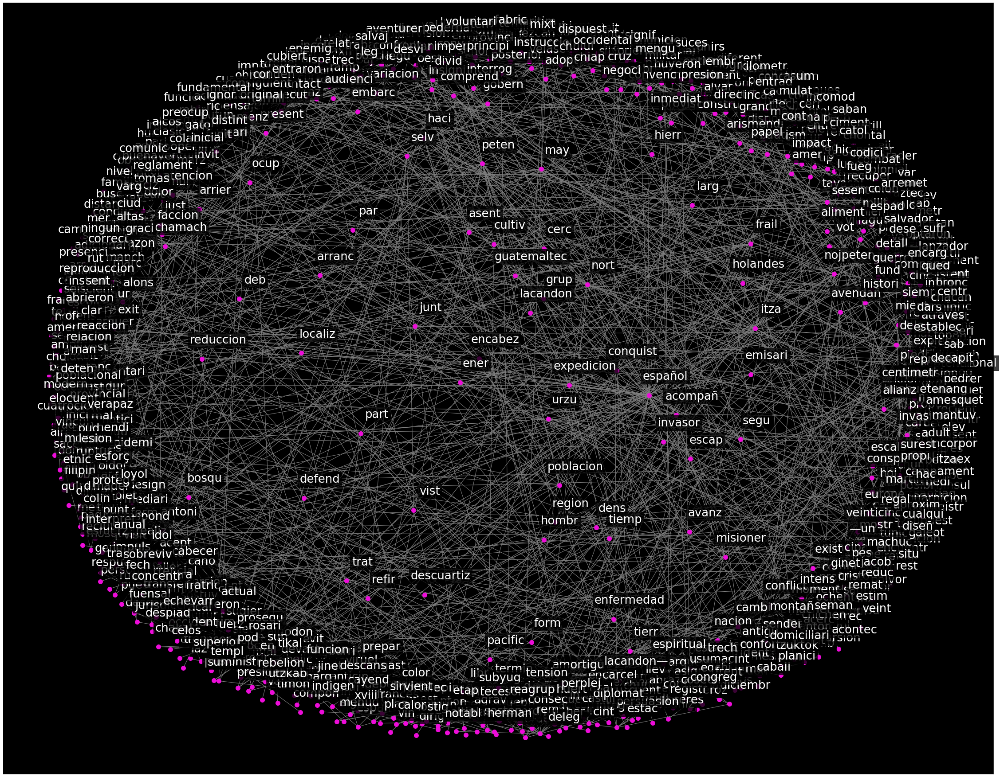

In [199]:
fig, ax = plt.subplots(figsize=(40, 32))
ax.set_facecolor('xkcd:black')
pos = nx.spring_layout(G, k=1)

# Plot networks
nx.draw_networkx(G, pos,
                 font_size=6,
                 width=1,
                 edge_color='grey',
                 node_size=100,
                 node_color='xkcd:fuchsia',
                 with_labels = False,
                 ax=ax)

# crear etiquetas
for key, value in pos.items():
    x, y = value[0]+.035, value[1]+.045
    ax.text(x, y,
            s=key,
            bbox=dict(facecolor='black', alpha=0.75),
            horizontalalignment='center', fontsize=26,color='white')
    
plt.show()

Observamos que las palabreas más comúnes son adverbios y pronombres, sin embargo estas palabras no son de nuestro interes ya que no contienen información semántica del texto, en el procesamiento de lenguaje natural, este es un problema común y *natural* del propio lenguaje, nos interesa explorar las relaciones de palabras de un texto y no quien hizo una acción o la cantidad de un objeto en que se realizo esta acción. Para el preprocesamiento de los textos se van a realizar los siguientes procesos:

- **Eliminación de stopwords** que es el nombre que reciben las palabras sin significado como artículos, pronombres, preposiciones, etc. al texto.[1]

- **Steamming-lemmatization de las palabras:** 
    Por razones gramaticales, los documentos utilizarán diferentes formas de una palabra, como organizar, organizado y organizar. Además, hay familias de palabras derivadas relacionadas con significados similares, como democracia y democratización. En muchas situaciones, parece que sería útil para una búsqueda de una de estas palabras devolver documentos que contienen otra palabra en el conjunto.

    El objetivo del Steamming-lemmatization es reducir las formas de inflexión y, a veces, las formas derivadas de una palabra a una forma de base común. Por ejemplo:
    
    $$ finanza, financiamiento, finanzas \Rightarrow finan $$

Para este proceso usaremos la librería NLKT para python.


### **Eliminación de stopwords**

Usemos el diccionario de Stopwords incorporado con la librería NLKT:

In [161]:
from nltk.corpus import stopwords
esp_stops = set(stopwords.words('spanish'))

Una muestra de estas stopwords en español son las siguientes:

    ['erais',  'eran',  'eras',  'eres',  'es',  'esa',  'esas',  'ese',  'eso',  'esos',  'esta',  'estaba',  'estabais',  'estaban',  'estabas',  'estad'...]
    
Iteremos sobre nuestro texto y guardemos las palabras resultantes en una lista:

In [162]:
texto_sin_SW = []

for word in textos: 
    if word not in esp_stops:
        texto_sin_SW.append(word)

### **Steamming-lemmatization de las palabras:** 

A continuación, nos quedamos con la raíz de cada palabra:

In [163]:
min_len = 4

def stemSentence(sentence, min_len=min_len):
    """
    info
    """
    
    token_words = word_tokenize(sentence)
    stem_sentence = []
    
    for word in token_words:
        if len(word) > min_len:
            stem_sentence.append(stemmer.stem(WordNetLemmatizer().lemmatize(word, pos='v')))
            stem_sentence.append(" ")
    return "".join(stem_sentence)

In [164]:
text_data = stemSentence(" ".join(texto_sin_SW))

El resultado obtenido despues del proceso es el siguiente:

In [165]:
text_data[0:200]

'conquist peten ultim etap conquist guatemal conflict prolong produj coloniz español amer peten ampli planici tierr baj cubiert dens selv tropical inclu cuenc hidrograf central vari lag zon saban llanu'

# Obtención de la red con los textos procesados:

Repetimos el proceso anterior:

In [169]:
# Guardamos cada para de palabras 
lista_nodo_i = []
lista_nodo_j = []
textos = text_data.split()
for row in range(len(textos)-1):
    lista_nodo_i.append(textos[row])
    lista_nodo_j.append(textos[row+1])
    
# Generamos un DF y lo poblamos con las listas
df_bigram = pd.DataFrame(columns=["nodo_i",'nodo_j'],
            index=[i for i in range(len(lista_nodo_i))])

df_bigram.loc[:,'nodo_i'] = lista_nodo_i
df_bigram.loc[:,'nodo_j'] = lista_nodo_j

In [241]:
df_bigram.shape

(7753, 2)

In [242]:
G = nx.from_pandas_edgelist(df=df_bigram, source='nodo_i',
                            target='nodo_j')

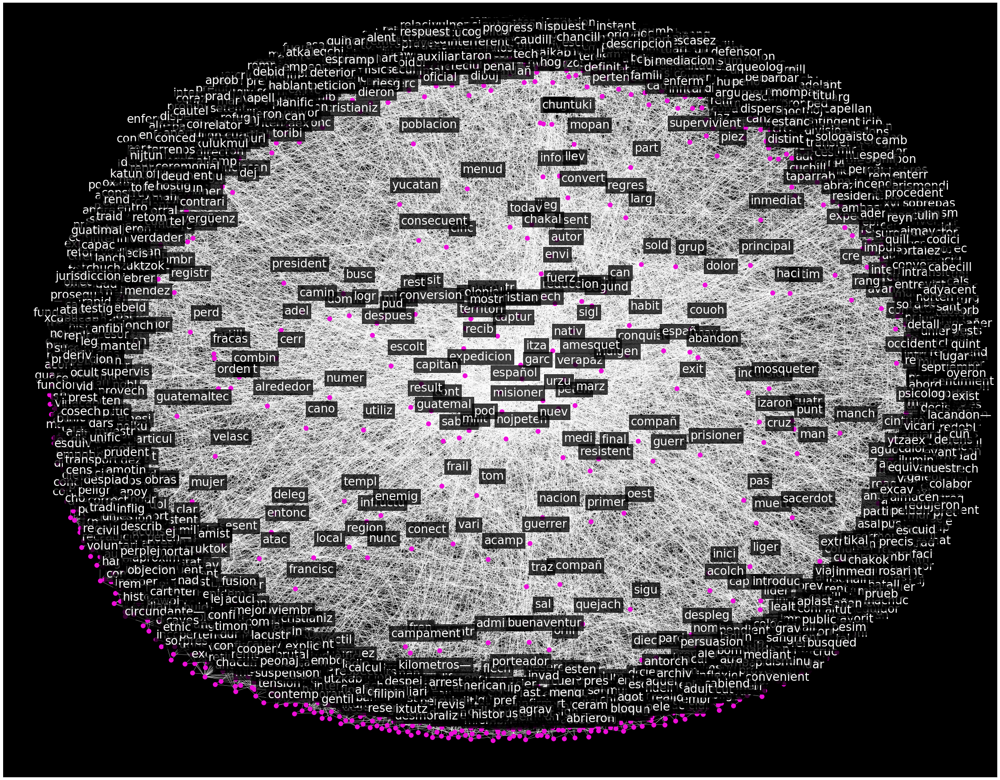

In [243]:
fig, ax = plt.subplots(figsize=(40, 32))
ax.set_facecolor('xkcd:black')
pos = nx.spring_layout(G, k=1)

# Plot networks
nx.draw_networkx(G, pos,
                 font_size=16,
                 width=0.5,
                 edge_color='white',
                 node_size=100,
                 node_color='xkcd:fuchsia',
                 with_labels = False,
                 ax=ax)

# crear etiquetas
for key, value in pos.items():
    x, y = value[0]+.035, value[1]+.045
    ax.text(x, y,
            s=key,
            bbox=dict(facecolor='black', alpha=0.75),
            horizontalalignment='center', fontsize=26,color='white')
    
plt.show()

In [244]:
nx.info(G)

'Name: \nType: Graph\nNumber of nodes: 1793\nNumber of edges: 6567\nAverage degree:   7.3252'

Observamos que tenemos una gráfica con nodos centrales, su densidad $$d = \frac{m}{n(n-1)} $$  Donde n es el numero de nodos y m el número de vértices es de:

In [245]:
nx.density(G)

0.004087697195442594

### Distribución de la red

La distribución de los grados de los nodos se muestra a continuación:

In [ ]:
degree_histogram(G)

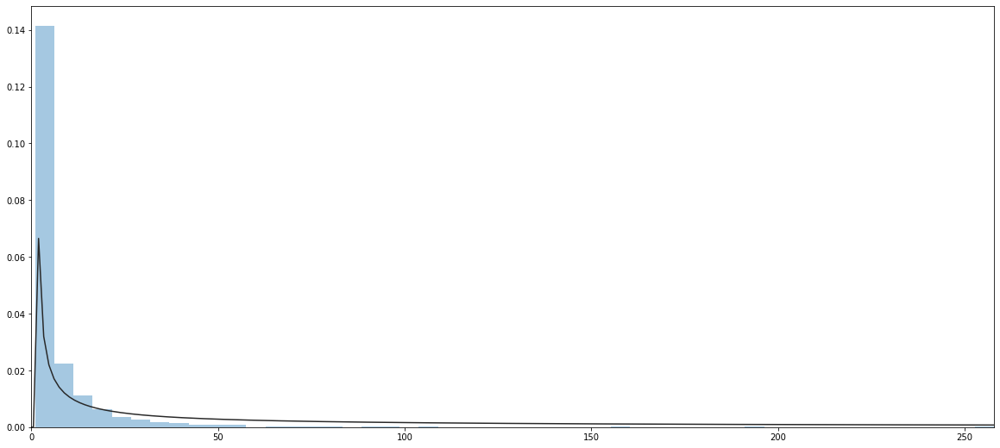

In [316]:
fig, ax = plt.subplots(figsize=(20, 9))
ax.set_xlim([0,258])
#ax.set_ylim([0, 5])
ax.set_facecolor('xkcd:white')
node_degree = [val for (node, val) in G.degree()]
sns.distplot(node_degree,kde=False, fit=stats.powerlaw)

La función de probabilidad de la distribución de la ley de potencias es:

$$ f(x,a)=ax^{a-1} $$

Para $0 \leq x \leq 1$, $ a \ge 0$

Y su PDF es:[2]

$$ PDF(powerlaw) = ak^a x^{-a-1} $$

Ajustemos la distribución y veamos su error asociado:

In [454]:
df = pd.DataFrame({
            'x':[val+2 for val in range(len(nx.degree_histogram(G))-2)],
            'y': nx.degree_histogram(G)[2:]
        })
def func_powerlaw(x, a,k):
    return a*k**a * x**(-a-1)

popt, pcov = curve_fit(func_powerlaw, df['x'], df['y'],maxfev=2000)


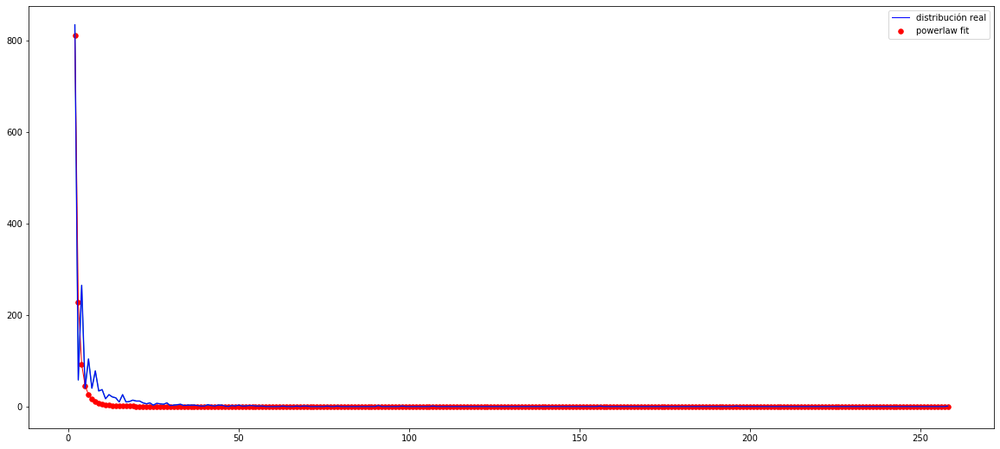

In [468]:
plt.figure(figsize=(20, 9))
plt.plot(df["x"], df["y"])
plt.scatter(df["x"], func_powerlaw(df["x"], *popt),s=30.3,color='red',label="powerlaw fit")
plt.plot(df["x"], func_powerlaw(df["x"], *popt),linewidth=1,color='red')

plt.plot(df["x"], df["y"],color='blue',linewidth=1, label="distribución real")
plt.legend()
plt.show()

Los parámetros del ajuste son:

In [456]:
popt

array([ 2.13421543, 44.74193803])

i.e $ a =2.13 $ lo cuál corresponde con Choromański, Krzysztof, *et.al*  que considera el parámetro a entre [2,3] para una red libre de escala.[3]

Veamos ahora el error cuadático medio del ajuste:

In [459]:
rmse = sqrt(mean_squared_error(df["y"],  func_powerlaw(df["x"], *popt)))
rmse

17.106907424899614

La R cuadrada del ajuste es:

In [462]:
r2 = r2_score(df["y"],  func_powerlaw(df["x"], *popt))
r2

0.9039549100227815

Los parametros son en consideración, satisfactorios.

### Anális de palabras de mayor grado

Veamos las palabras de mayor grado:

In [463]:
node_degree = [val for (node, val) in G.degree()]
node_name = [node for (node, val) in G.degree()]

orden_grado = np.argsort(node_degree, axis=-1, kind='quicksort', order=None)[::-1]

[(node_name[nodo],node_degree[nodo]) for nodo in orden_grado[:20]]

[('español', 258),
 ('itza', 196),
 ('peten', 156),
 ('may', 107),
 ('expedicion', 98),
 ('nojpeten', 91),
 ('grup', 91),
 ('lleg', 79),
 ('sold', 76),
 ('haci', 70),
 ('guatemal', 69),
 ('conquist', 67),
 ('frail', 63),
 ('yucatan', 57),
 ('garc', 56),
 ('quejach', 55),
 ('part', 54),
 ('orill', 54),
 ('encontr', 53),
 ('despues', 53)]

### Conclusiones

### Lineas sugeridas

## Referencias

[1] https://www.wikiwand.com/es/Palabra_vacía

[2] https://docs.scipy.org/doc/scipy/reference/generated/scipy.stats.powerlaw.html#scipy.stats.powerlaw

[3] Choromański, K., Matuszak, M. & Miȩkisz, J. J Stat Phys (2013) 151: 1175. https://doi.org/10.1007/s10955-013-0749-1
